<a href="https://colab.research.google.com/github/brian-ho/intro-to-urban-data/blob/main/Measure/M04_Accessing_image_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **04 Measure** Accessing image data
```
    Class       ARCH 6131 Urban Design Methods / Skills / Tools 1
                The Gensler Family AAP NYC Center
                Fall 2023
                Monday 3:30 PM to 6 PM

    Instructor  Brian Ho
                brian@brian-ho.io
```

This notebook explore how to access image data: both the visuals themselves and associated metadata. It assumes you've understood the first three notebooks. In particular, how we load in external libraries and packages, the basics of data structures and functions, and opening image files.

- PIL basics
- Accessing metadata
- Accessing image data
- Advanced techniques

To open HEIC photos taken by iPhone, we'll need an additional package.

In [ ]:
!pip install pillow-heif --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 36.0 MB/s eta 0:00:00


As before, we'll need to import the right libraries into this notebook.

In [ ]:
import PIL
from pathlib import Path
from pillow_heif import register_heif_opener

register_heif_opener()

... and connect to Google Drive and set the appropriate direcotry for the example data. You can find it here on [GitHub](https://github.com/brian-ho/intro-to-urban-data/tree/main/Measure/Example%20Data). Or, try this with your own data!

In [ ]:
from google.colab import drive

drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
EXAMPLE_DATA_DIRECTORY = (
    "/content/drive/MyDrive/Cornell AAP - MSAUD/ARCH 6131/Example Data"
)

## PIL basics
`PIL`, or [Python Image Library](https://pillow.readthedocs.io/en/stable/) provides image operations in Python.

It won't replace more advanced image editing tools for design, but it's a great way to work with image data more directly and efficiently.

Let's start by opening an image file, using the `Image` class to create an object. Basically, this opens the file and loads it into a Python format provided by `PIL` that we can work with.



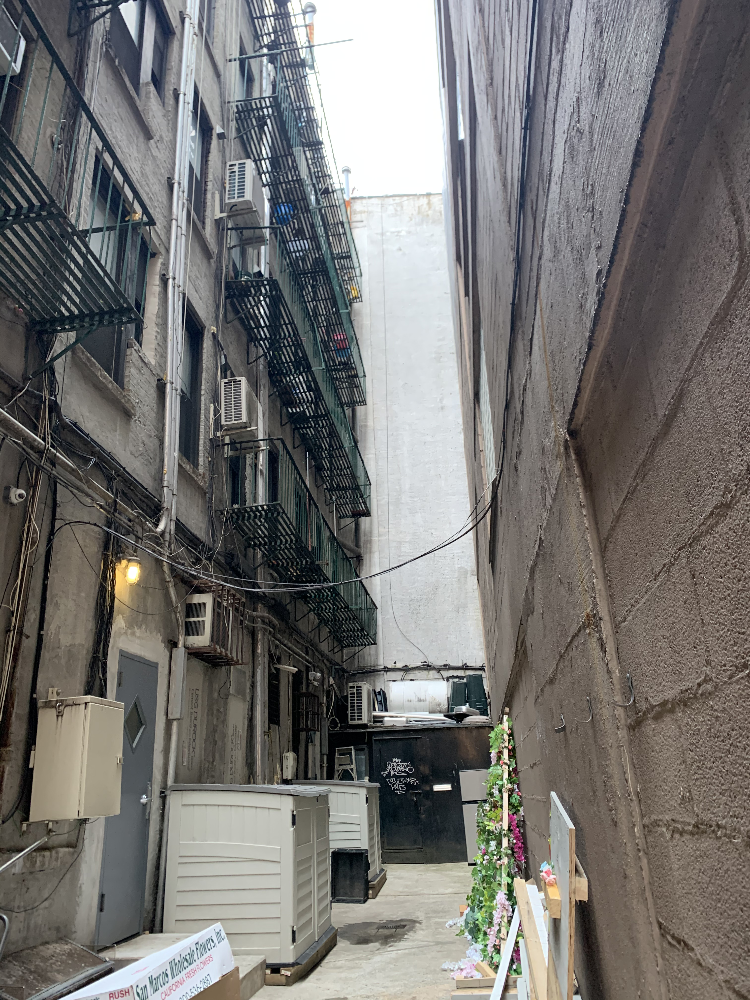

In [102]:
# Open an iPhone HEIC image stored on Google Drive
img = PIL.Image.open(Path(EXAMPLE_DATA_DIRECTORY) / 'IMG_1605.HEIC')

# The last line in a notebook cell will get rendered
img

`PIL` is nice in that image objects give you a few ways to work with them out-of-the-box. In this case, the `Image` class has both methods and attributes. Methods are functions attached to the class or object; attribtues are data values attached to the class or object.

Complete object-oriented programming (OOP) is out-of-scope for this semester, but it's helpful to know that in Python, an object is a persistent "thing" that has associated information and actions. So in this case, you create an `Image` object, based on the class. And you can get information about the image, and perform actions to and with it.

In [108]:
# Some simple attribtues that give you information about the image
# What size is the image?
print(f'This image is {img.size} in pixel dimensions')

# What is the color mode of the image?
print(f'This image is in {img.mode} color mode')

# What's the full filename of this image?
print(f'The image is {img.filename}')

This image is (3024, 4032) in pixel dimensions
This image is in RGB color mode
The image is /content/drive/MyDrive/Cornell AAP - MSAUD/ARCH 6131/Example Data/IMG_1605.HEIC


Pretty cool! You can find the complete list of `Image` attributes in the documentation for `PIL` [here](https://pillow.readthedocs.io/en/latest/reference/Image.html#image-attributes). Try to access a few new ones!

In [109]:
# Let's see all the info about this image!
img.info

{'primary': True,
 'bit_depth': 8,
 'exif': b'Exif\x00\x00MM\x00*\x00\x00\x00\x08\x00\x0c\x01\x0f\x00\x02\x00\x00\x00\x06\x00\x00\x00\x9e\x01\x10\x00\x02\x00\x00\x00\n\x00\x00\x00\xa4\x01\x12\x00\x03\x00\x00\x00\x01\x00\x01\x00\x00\x01\x1a\x00\x05\x00\x00\x00\x01\x00\x00\x00\xae\x01\x1b\x00\x05\x00\x00\x00\x01\x00\x00\x00\xb6\x01(\x00\x03\x00\x00\x00\x01\x00\x02\x00\x00\x011\x00\x02\x00\x00\x00\x07\x00\x00\x00\xbe\x012\x00\x02\x00\x00\x00\x14\x00\x00\x00\xc6\x01<\x00\x02\x00\x00\x00\n\x00\x00\x00\xda\x02\x13\x00\x03\x00\x00\x00\x01\x00\x01\x00\x00\x87i\x00\x04\x00\x00\x00\x01\x00\x00\x00\xe4\x88%\x00\x04\x00\x00\x00\x01\x00\x00\x08$\x00\x00\x00\x00Apple\x00iPhone XS\x00\x00\x00\x00H\x00\x00\x00\x01\x00\x00\x00H\x00\x00\x00\x0114.4.2\x00\x002021:04:04 14:53:54\x00iPhone XS\x00\x00$\x82\x9a\x00\x05\x00\x00\x00\x01\x00\x00\x02\x9a\x82\x9d\x00\x05\x00\x00\x00\x01\x00\x00\x02\xa2\x88"\x00\x03\x00\x00\x00\x01\x00\x02\x00\x00\x88\'\x00\x03\x00\x00\x00\x01\x00d\x00\x00\x90\x00\x00\x07\x00\x00\

The `Image` class also provides some methods, or functions! For example, you can crop the image:

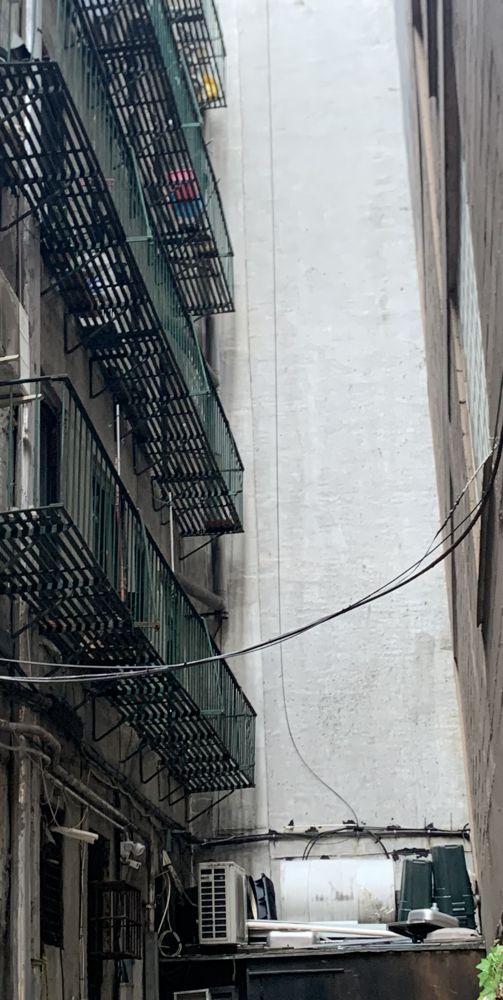

In [114]:
# Let's use a variable to store the crop
crop_amount = 1000

# Crop takes in a tuple, or sequence of values in parenthesis () that define the min x, min y, max x and max y of the crop
img.crop((crop_amount, crop_amount, img.width - crop_amount, img.height - crop_amount))

You can find all of the methods defined for the `Image` class [here in the docs](https://pillow.readthedocs.io/en/latest/reference/Image.html#PIL.Image.Image.crop). Try calling some of those methods on your loaded image.

## Resizing an image
One useful method is `Image.resize()` which produces a re-sized version of your image. It takes on argument: a tuple or sequence of values in side paranthesis (), which define the width and height.

You can use this to shrink and re-format and image!

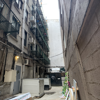

In [ ]:
# Resive the photo to be square
smaller_img = img.resize((100, 100))
smaller_img

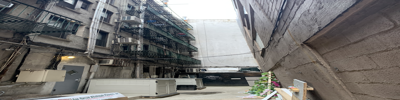

In [121]:
# Resize the photo to be stretched
stretched_img = img.resize((400, 100))
stretched_img

Of course, if you don't want to distort your image you can use `Image.thumbnail()`. This wil shrink it to fit your provided dimensions, but preserve the aspect ratio.

Confusingly, `thumbnail()` has a different behavior to `resize()`. Rather than give you a new image it directly modifies the original image. This is called "mutating" and the important concept is it's a change to the underlying object.

To be safe, you can use another method, `Image.copy()` to make an extra copy of the image to thumbnail!

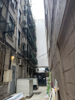

In [127]:
# Notice that we call thumbnail() on a copy() of the image
# thumbnail() directly changes the image, vs. returning a new one
# This line produces a new image as a copy
new_img = img.copy()

# This line reduces the copied image to a thumbnail
new_img.thumbnail((100, 100))

# This line renders the thumbnail in the notebook
new_img

## Color modes
`PIL` lets you work with images in a few color modes. These define how the image represents color data for each pixel. If you've used software for printing, you may be familiar with CMYK representations — which `PIL` does support! But in this course, for image data, you will most likely work with:

- `RGB` 3x8-bit pixels, true colour
- `RGBA` 4x8-bit pixels, true colour with alpha (transparency)
- `L` 8-bit pixels, usually greyscale
- `1` 1-bit pixels, black and white, stored with one pixel per byte
- `P` 8-bit pixels, using a palette (typically of 256 colors)

In [129]:
# Let's check the mode of the smaller image we created earlier — it should be RGB
smaller_img.mode

'RGB'

We can conver this image to an alternative color mode!

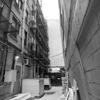

In [ ]:
# Convert the image to a different color mode
# "L" is for "Luminance", but it means there's one color channel
# Which is equivalent to greyscale
smaller_img.convert('L')

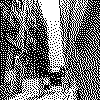

In [ ]:
# Greyscale
smaller_img.convert('1')

## Histogram

<Axes: >

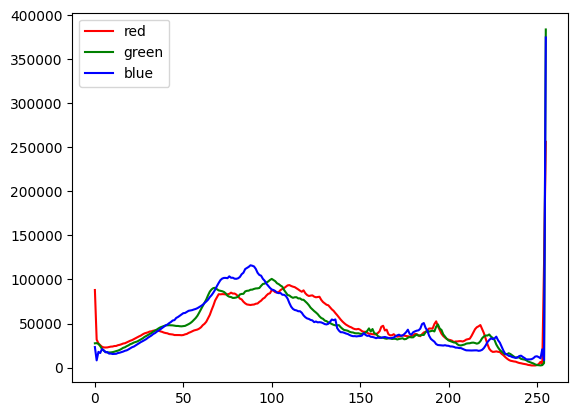

In [130]:
import pandas as pd

hist = img.histogram()
df = pd.DataFrame({
    'red': hist[:256],
    'green': hist[256:512],
    'blue': hist[512:]
})
df.plot(color=df.columns)

## Color frequency

In [134]:
p_img = smaller_img.convert('P')
p = p_img.getpalette()

In [135]:
df = pd.DataFrame(p_img.getcolors(), columns=['count', 'color_index'])
df['color'] = df['color_index'].apply(lambda x: [v/255.0 for v in p[x * 3:x * 3 + 3]])
df

,count,color_index,color
0,85,0,"[0.0, 0.0, 0.0]"
1,22,11,"[0.2, 0.0, 0.0]"
2,38,16,"[0.0, 0.2, 0.0]"
3,40,17,"[0.2, 0.2, 0.0]"
4,61,46,"[0.0, 0.0, 0.2]"
5,42,47,"[0.2, 0.0, 0.2]"
6,120,52,"[0.0, 0.2, 0.2]"
7,1475,53,"[0.2, 0.2, 0.2]"
8,305,54,"[0.4, 0.2, 0.2]"
9,143,59,"[0.2, 0.4, 0.2]"


<Axes: >

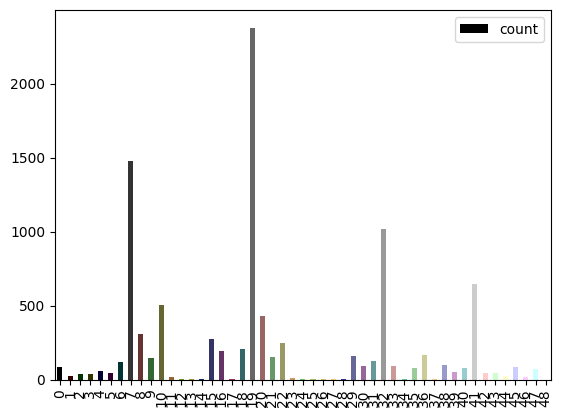

In [136]:
df.plot.bar(y='count', color=df['color'])

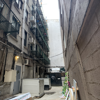

In [137]:
smaller_img